In [ ]:
%matplotlib inline

# Deep Convolutional Generative Adversarial Networks for Image Synthesis

## Before starting

Before you start, make sure that all the files provided with the practice are in the same directory as this Notebook.

### If you are using Google Colab
If you are using Google Colab, you need to choose an execution framework with GPUs. Hence go to runtime environment->Change runtime environment->GPU as hardware accelerator.

## Goal 

The purpose of this laboratory is that the student becomes familiar with Generative Adversial Networks (GAN) through an example. One of these GAN networks will be trained to generate new handwritten digits after being taught multiple real instances of them. This document aims to give a comprehensive explanation of how and why these models work.

GANs are a _framework_ that allows to teach a _Deep Learning_ model to capture the distribution of some data so that it can generate new data from the same distribution. GANs were initially proposed by Ian Goodfellow in 2014 and described in reference [1]. They are composed of two different models:

- The generator, which specializes in producing synthetic data similar to actual training images.
- The discriminator, which, based on an input image, specializes in deciding whether it is real or synthetic.

Both networks are trained together, so that the generator tries to beat the discriminator by generating synthetic data increasingly similar to the real images; and the discriminator tries to differentiate the synthetic data from the real one, continuously improving in this task.

The following figure shows a simple example of an GAN specialized in the generation of handwritten digits [2].
 
![Image of GAN](http://www.tsc.uc3m.es/~igonzalez/images/gan_example.jpg)
This tutorial is adapted from the tutorial available at https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html.

## Useful references

- [1] GANs. _Generative Adversarial Nets_. https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf
- [2] Imagen. https://i.blogs.es/bd2b76/gan_arquitectura/1366_2000.jpg
- [3] DCGANs. _Unsupervised Representation Learning With Deep Convolutional Generative Adversarial Networks_. https://arxiv.org/pdf/1511.06434.pdf
- [4] Celeb-A Faces dataset. http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html
- [5] Celeb-A Faces dataset. https://drive.google.com/drive/folders/0B7EVK8r0v71pTUZsaXdaSnZBZzg
- [6] Ganhacks. Best practices to train GANs. https://github.com/soumith/ganhacks
- [7] GAN — Why it is so hard to train Generative Adversarial Networks! https://medium.com/@jonathan_hui/gan-why-it-is-so-hard-to-train-generative-advisory-networks-819a86b3750b
- [8] MNIST handwritten digits database: http://yann.lecun.com/exdb/mnist/
- [9] CIFAR-10 database: https://www.cs.toronto.edu/~kriz/cifar.html

## Part 1. Theory about GANs

Although it may be very useful to take a look at the article on GANs [1], this section will explain the most important concepts of the algorithm that are necessary for the development of the practice.

### GANs

GANs are made of two distinct models, a *generator* and a *discriminator*. The job of the generator is to spawn ‘fake’ images that look like the training images. The job of the discriminator is to look at an image and output whether or not it is a real training image or a fake image from the generator. During training, the generator is
constantly trying to outsmart the discriminator by generating better and better fakes, while the discriminator is working to become a better detective and correctly classify the real and fake images. The equilibrium of this game is when the generator is generating perfect fakes that look as if they came directly from the training data, and the discriminator is left to always guess at 50% confidence that the generator output is real or fake.

Now, lets define some notation to be used throughout tutorial starting with the discriminator. Let $x$ be data representing an image. $D(x)$ is the discriminator network which outputs the (scalar) probability that $x$ came from training data rather than the generator. Here, since we are dealing with images the input to $D(x)$ is an image of CHW size 3x64x64. Intuitively, $D(x)$ should be HIGH when $x$ comes from training data and LOW when
$x$ comes from the generator. $D(x)$ can also be thought of as a traditional binary classifier.

For the generator’s notation, let $z$ be a latent space vector sampled from a standard normal distribution. $G(z)$ represents the generator function which maps the latent vector $z$ to data-space. The goal of $G$ is to estimate the distribution that the training data comes from ($p_{data}$) so it can generate fake samples from
that estimated distribution ($p_g$).

So, $D(G(z))$ is the probability (scalar) that the output of the generator $G$ is a real image. As described in [1], $D$ and $G$ play a minimax game in which $D$ tries to maximize the probability it correctly classifies reals and fakes ($logD(x)$), and $G$ tries to minimize the probability that $D$ will predict its outputs are fake ($log(1-D(G(x)))$). From the paper, the GAN loss function is

\begin{align}\underset{G}{\text{min}} \underset{D}{\text{max}}V(D,G) = \mathbb{E}_{x\sim p_{data} (x)}\big[logD(x)\big] + \mathbb{E}_{z\sim p_{z}(z)}\big[log(1-D(G(z)))\big]\end{align}

In theory, the solution to this minimax game is where $p_g = p_{data}$, and the discriminator guesses randomly if the inputs are real or fake. However, the convergence theory of GANs is still being actively researched and in reality models do not always train to this point.


### DCGANs

A DCGAN is a direct extension of the GAN described above, except that it explicitly uses convolutional and convolutional-transpose layers in the discriminator and generator, respectively. It was first described by
Radford et. al. in the paper `Unsupervised Representation Learning With Deep Convolutional Generative Adversarial Networks` [3]. The discriminator is made up of strided `convolution` layers, `batch norm`
layers, and `LeakyReLU` activations. The input is a 3x64x64 input image and the output is a scalar probability that the input is from the real data distribution.

The generator is comprised of `convolutional-transpose` layers, `batch norm` layers, and `ReLU` activations. The
input is a latent vector, $z$, that is drawn from a standard normal distribution and the output is a 3x64x64 RGB image. The strided conv-transpose layers allow the latent vector to be transformed into a volume with the same shape as an image. In the paper, the authors also give some tips about how to setup the optimizers, how to calculate the loss functions, and how to initialize the model weights, all of which will be explained in the Implementation section.


## Part 2. Implementation

First, we need to import the necessary packages and impose a manual seed on randomness to ensure the reproducibility of results.

In [ ]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import cv2
import copy

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
# torch uses some non-deterministic algorithms
torch.backends.cudnn.enabled = False

Random Seed:  999


### Inputs

Let’s define some inputs for the run:

-  **dataroot** - the path to the root of the dataset folder. We will
   talk more about the dataset in the next section
-  **workers** - the number of worker threads for loading the data with
   the DataLoader
-  **batch_size** - the batch size used in training. The DCGAN paper
   uses a batch size of 128
-  **image_size** - the spatial size of the images used for training.
   This implementation defaults to 64x64. If another size is desired,
   the structures of D and G must be changed. See
   `here <https://github.com/pytorch/examples/issues/70>`__ for more
   details
-  **nc** - number of color channels in the input images. For color
   images this is 3
-  **nz** - length of latent vector
-  **ngf** - relates to the depth of feature maps carried through the
   generator
-  **ndf** - sets the depth of feature maps propagated through the
   discriminator
-  **num_epochs** - number of training epochs to run. Training for
   longer will probably lead to better results but will also take much
   longer
-  **lr** - learning rate for training. As described in the DCGAN paper,
   this number should be 0.0002
-  **beta1** - beta1 hyperparameter for Adam optimizers. As described in
   paper, this number should be 0.5
-  **ngpu** - number of GPUs available. If this is 0, code will run in
   CPU mode. If this number is greater than 0 it will run on that number
   of GPUs



In [ ]:
# Root directory for dataset
dataroot = "mnist"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.001 #It may not reach a good solution in some executions. 
#If so, please increase the value in the range (0.001-0.005

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

### Datasets

For this tutorial the `MNIST` database [8] will be used. The database can be downloaded from Pytorch directly in the `dataroot` directory.

cuda:0


Extracting mnist/MNIST/raw/train-images-idx3-ubyte.gz to mnist/MNIST/raw


Extracting mnist/MNIST/raw/train-labels-idx1-ubyte.gz to mnist/MNIST/raw


Extracting mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to mnist/MNIST/raw




Extracting mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to mnist/MNIST/raw
Processing...
Done!


/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.


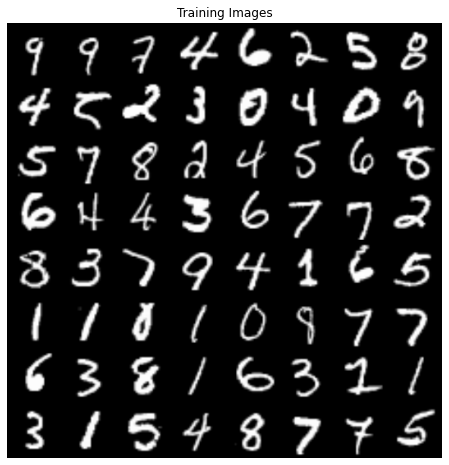

In [ ]:
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
print(device)
# MNIST database
if not os.path.exists(dataroot):
    os.makedirs(dataroot)
    
# Download files training.pt and test.pt 
dataloader = torch.utils.data.DataLoader(
  dset.MNIST(dataroot, train=True, download=True,
                             transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize(
                                 (0.1307,), (0.3081,))
                             ])),
  batch_size=batch_size,shuffle=True, num_workers=workers)

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

### Network architecture

Once we have defined the input parameters and the database is ready, we can go proceed with the definition of the network. We start with the initialization strategy of the architecture weights, and then we will talk about the generator, the discriminator and the loss functions.

#### Weights initialization

From the DCGAN paper [3], the authors specify that all model weights shall be randomly initialized from a Normal distribution with mean=0, stdev=0.02. The weights_init function takes an initialized model as input and reinitializes all convolutional, convolutional-transpose, and batch normalization layers to meet this criteria. This function is applied to the models immediately after initialization

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

#### Generador

The generator, $G$, is designed to map the latent space vector $z$ to data-space. Since our data are images, converting $z$ to data-space means ultimately creating a RGB image with the same size as the training images (i.e. 3x64x64). In practice, this is accomplished through a series of strided two dimensional convolutional transpose layers, each paired with a 2d batch norm layer and a relu activation. The output of the generator is fed through a tanh function to return it to the input data range of [−1,1]. It is worth noting the existence of the batch norm functions after the conv-transpose layers, as this is a critical contribution of the DCGAN paper. These layers help with the flow of gradients during training. An image of the generator from the DCGAN paper (with parameters *nz*=100, *ngf*=128 y *nc*=3) is shown below (it is not the actual one we will use in this practice).

![Image of DCGAN Generator](http://www.tsc.uc3m.es/~igonzalez/images/dcgan_generator.png)

Notice, the how the inputs we set in the input section (*nz*, *ngf*, and *nc*) influence the generator architecture in code. *nz* is the length of the z input vector, *ngf* relates to the size of the feature maps
that are propagated through the generator, and *nc* is the number of channels in the output image (set to 3 for RGB images). 

In [ ]:
# Generator Code
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

Now, we can instantiate the generator and apply the ``weights_init`` function. Check out the printed model to see how the generator object is structured.

In [ ]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


### Discriminator

As mentioned, the discriminator, $D$, is a binary classification network that takes an image as input and outputs a scalar probability that the input image is real (as opposed to fake). Here, $D$ takes a 3x64x64 input image, processes it through a series of Conv2d, BatchNorm2d, and LeakyReLU layers, and outputs the final probability
through a Sigmoid activation function. This architecture can be extended with more layers if necessary for the problem, but there is significance to the use of the strided convolution, BatchNorm, and LeakyReLUs. The
DCGAN paper mentions it is a good practice to use strided convolution rather than pooling to downsample because it lets the network learn its own pooling function. Also batch norm and leaky relu functions promote
healthy gradient flow which is critical for the learning process of both $G$ and $D$.


In [ ]:
# Discriminator Code
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

Now, as with the generator, we can create the discriminator, apply the ``weights_init`` function, and print the model’s structure.

In [ ]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


#### Loss Functions and optimizers

With $D$ and $G$ setup, we can specify how they learn through the loss functions and optimizers. We will use the Binary Cross Entropy loss (`https://pytorch.org/docs/stable/nn.html#torch.nn.BCELoss`) function which is defined in PyTorch as:

\begin{align}\ell(x, y) = L = \{l_1,\dots,l_N\}^\top, \quad l_n = - \left[ y_n \cdot \log x_n + (1 - y_n) \cdot \log (1 - x_n) \right]\end{align}

Notice how this function provides the calculation of both log components
in the objective function (i.e. $log(D(x))$ and
$log(1-D(G(z)))$). We can specify what part of the BCE equation to
use with the $y$ input. This is accomplished in the training loop
which is coming up soon, but it is important to understand how we can
choose which component we wish to calculate just by changing $y$
(i.e. GT labels).

Next, we define our real label as 1 and the fake label as 0. These
labels will be used when calculating the losses of $D$ and
$G$, and this is also the convention used in the original GAN
paper [1]. Finally, we set up two separate optimizers, one for $D$ and
one for $G$. As specified in the DCGAN paper, both are Adam
optimizers with learning rate 0.0002 and Beta1 = 0.5. For keeping track
of the generator’s learning progression, we will generate a fixed batch
of latent vectors that are drawn from a Gaussian distribution
(i.e. fixed_noise) . In the training loop, we will periodically input
this fixed_noise into $G$, and over the iterations we will see
images form out of the noise.



In [ ]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

### Training


Finally, now that we have all of the parts of the GAN framework defined,
we can train it. Be mindful that training GANs is somewhat of an art
form, as incorrect hyperparameter settings lead to mode collapse with
little explanation of what went wrong. Here, we will closely follow
Algorithm 1 from Goodfellow’s paper [1], while abiding by some of the best
practices shown in [6].
Namely, we will “construct different mini-batches for real and fake”
images, and also adjust G’s objective function to maximize
$logD(G(z))$ rather than minimizing log(1-D(G(z))). Training is split up into two main parts. Part 1
updates the Discriminator and Part 2 updates the Generator.

**Part 1 - Train the Discriminator**

Recall, the goal of training the discriminator is to maximize the
probability of correctly classifying a given input as real or fake. In
terms of Goodfellow, we wish to “update the discriminator by ascending
its stochastic gradient”. Practically, we want to maximize
$log(D(x)) + log(1-D(G(z)))$. Due to the separate mini-batch
suggestion from ganhacks [6], we will calculate this in two steps. First, we
will construct a batch of real samples from the training set, forward
pass through $D$, calculate the loss ($log(D(x))$), then
calculate the gradients in a backward pass. Secondly, we will construct
a batch of fake samples with the current generator, forward pass this
batch through $D$, calculate the loss ($log(1-D(G(z)))$),
and *accumulate* the gradients with a backward pass. Now, with the
gradients accumulated from both the all-real and all-fake batches, we
call a step of the Discriminator’s optimizer.

**Part 2 - Train the Generator**

As stated in the original paper [1], we want to train the Generator by
minimizing $log(1-D(G(z)))$ in an effort to generate better fakes.
As mentioned, this was shown by Goodfellow to not provide sufficient
gradients, especially early in the learning process. As a fix, we
instead wish to maximize $log(D(G(z)))$. In the code we accomplish
this by: classifying the Generator output from Part 1 with the
Discriminator, computing G’s loss *using real labels as GT*, computing
G’s gradients in a backward pass, and finally updating G’s parameters
with an optimizer step. It may seem counter-intuitive to use the real
labels as GT labels for the loss function, but this allows us to use the
$log(x)$ part of the BCELoss (rather than the $log(1-x)$
part) which is exactly what we want.

Finally, we will do some statistic reporting and at the end of each
epoch we will push our fixed_noise batch through the generator to
visually track the progress of G’s training. The training statistics
reported are:

-  **Loss_D** - discriminator loss calculated as the sum of losses for
   the all real and all fake batches ($log(D(x)) + log(D(G(z)))$).
-  **Loss_G** - generator loss calculated as $log(D(G(z)))$
-  **D(x)** - the average output (across the batch) of the discriminator
   for the all real batch. This should start close to 1 then
   theoretically converge to 0.5 when G gets better. Think about why
   this is.
-  **D(G(z))** - average discriminator outputs for the all fake batch.
   The first number is before D is updated and the second number is
   after D is updated. These numbers should start near 0 and converge to
   0.5 as G gets better. Think about why this is.

**Note:** This step might take a while, depending on how many epochs you
run and if you removed some data from the dataset.


In [ ]:

# Training Function
def train_gan(netD, netG, dataloader,optimizerD, optimizerG, num_epochs=5,results_dir='results',manualSeed=1):
    
    # Lists to keep track of progress
    img_list    = []
    G_losses    = []
    D_losses    = []
    iters = 0

    print("Starting Training Loop...")
    # For each epoch
    for epoch in range(num_epochs):
        # For each batch in the dataloader
        for i, data in enumerate(dataloader, 0):

            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            ## Train with all-real batch
            netD.zero_grad()
            # Format batch
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, device=device)
            # Forward pass real batch through D
            output = netD(real_cpu).view(-1)
            # Calculate loss on all-real batch
            errD_real = criterion(output, label)
            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()

            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, nz, 1, 1, device=device)
            # Generate fake image batch with G
            fake = netG(noise)
            label.fill_(fake_label)
            # Classify all fake batch with D
            output = netD(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = criterion(output, label)
            # Calculate the gradients for this batch
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            # Add the gradients from the all-real and all-fake batches
            errD = errD_real + errD_fake
            # Update D
            optimizerD.step()

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            netG.zero_grad()
            label.fill_(real_label)  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = netD(fake).view(-1)
            # Calculate G's loss based on this output
            errG = criterion(output, label)
            # Calculate gradients for G
            errG.backward()
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG.step()

            # Output training stats
            if i % 50 == 0:
                print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                      % (epoch, num_epochs, i, len(dataloader),
                         errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())

            # Check how the generator is doing by saving G's output on fixed_noise
            if (iters % 50 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
                with torch.no_grad():
                    netG.eval()
                    fake = netG(fixed_noise).detach().cpu()
                    netG.train()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            iters += 1
        # Save results for each epoch
        if not os.path.exists(results_dir):
            os.makedirs(results_dir)
        with torch.no_grad():
            fake = netG(fixed_noise).detach().cpu()   
        img_grid=np.array(255.0*np.transpose(vutils.make_grid(fake, padding=2, normalize=True),(1,2,0))).astype(np.uint8)
        cv2.imwrite(os.path.join(results_dir,'epoch_'+str(epoch)+'.png'),cv2.cvtColor(img_grid, cv2.COLOR_RGB2BGR))
    
    # For the purpose of representation, we implement a moving average filter to reduce the noise:
    # consecutive iterations can have very different loss values but we are interested in their trend
    N = 20
    cumsumD, moving_avesD = [0], []
    cumsumG, moving_avesG = [0], []
    
    for i, x in enumerate(D_losses, 1):
        cumsumD.append(cumsumD[i-1] + x)
        if i>=N:
            moving_aveD = (cumsumD[i] - cumsumD[i-N])/N
            moving_avesD.append(moving_aveD)
            
    for i, x in enumerate(G_losses, 1):
        cumsumG.append(cumsumG[i-1] + x)
        if i>=N:
            moving_aveG = (cumsumG[i] - cumsumG[i-N])/N
            moving_avesG.append(moving_aveG)
    return (moving_avesD, moving_avesG, img_list)
    #return (D_losses, G_losses, img_list)

## Part 3. Experiments.

### 1. Checking if training is correct.

- You are asked to analyze how loss functions for $D$ and $G$ evolve along the training process.

In [ ]:
# Training stage
baseline_dir=os.path.join('results','baseline')
if not os.path.exists(baseline_dir):
    os.makedirs(baseline_dir)
[D_losses,G_losses,img_list]=train_gan(netD, netG, dataloader, optimizerD, optimizerG,num_epochs,baseline_dir,manualSeed)
state = {'state_dict': netD.state_dict(),}
torch.save(state, os.path.join(baseline_dir,'netD.pth'))
state = {'state_dict': netG.state_dict(),}
torch.save(state, os.path.join(baseline_dir,'netG.pth'))
np.save(os.path.join(baseline_dir,'G_losses.npy'),np.array(G_losses))
np.save(os.path.join(baseline_dir,'D_losses.npy'),np.array(D_losses))

Starting Training Loop...


/pytorch/aten/src/ATen/native/TensorFactories.cpp:361: UserWarning: Deprecation warning: In a future PyTorch release torch.full will no longer return tensors of floating dtype by default. Instead, a bool fill_value will return a tensor of torch.bool dtype, and an integral fill_value will return a tensor of torch.long dtype. Set the optional `dtype` or `out` arguments to suppress this warning.


[0/5][0/469]	Loss_D: 1.6887	Loss_G: 10.9172	D(x): 0.4191	D(G(z)): 0.4076 / 0.0001
[0/5][50/469]	Loss_D: 2.4120	Loss_G: 0.2255	D(x): 0.1721	D(G(z)): 0.0051 / 0.8301
[0/5][100/469]	Loss_D: 1.0840	Loss_G: 1.9389	D(x): 0.4756	D(G(z)): 0.0382 / 0.2141
[0/5][150/469]	Loss_D: 1.2538	Loss_G: 3.0024	D(x): 0.8159	D(G(z)): 0.5921 / 0.0831
[0/5][200/469]	Loss_D: 1.2988	Loss_G: 2.7456	D(x): 0.8689	D(G(z)): 0.6241 / 0.0830
[0/5][250/469]	Loss_D: 0.8276	Loss_G: 3.8124	D(x): 0.8186	D(G(z)): 0.4170 / 0.0319
[0/5][300/469]	Loss_D: 1.0886	Loss_G: 2.3618	D(x): 0.7918	D(G(z)): 0.5196 / 0.1116
[0/5][350/469]	Loss_D: 1.0567	Loss_G: 1.9196	D(x): 0.7174	D(G(z)): 0.4625 / 0.1859
[0/5][400/469]	Loss_D: 1.0345	Loss_G: 1.2214	D(x): 0.6281	D(G(z)): 0.3687 / 0.3326
[0/5][450/469]	Loss_D: 1.0998	Loss_G: 2.7623	D(x): 0.8730	D(G(z)): 0.5887 / 0.0786
[1/5][0/469]	Loss_D: 0.8612	Loss_G: 2.1046	D(x): 0.8129	D(G(z)): 0.4386 / 0.1516
[1/5][50/469]	Loss_D: 1.1470	Loss_G: 1.1280	D(x): 0.4334	D(G(z)): 0.2009 / 0.3753
[1/5][100

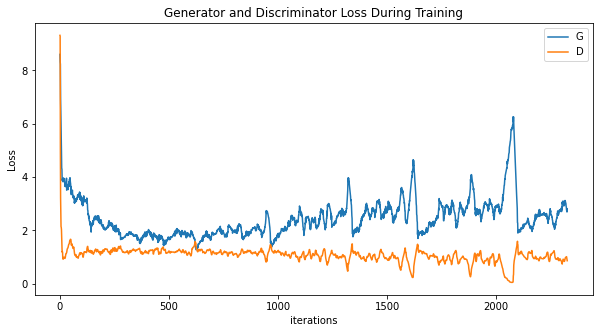

In [ ]:
# Loss versus training iteration
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

- Remember how we saved the generator’s output $G$ on the fixed_noise batch
after every epoch of training. Now, we can visualize the training
progression of G with an animation. Press the play button to start the
animation.


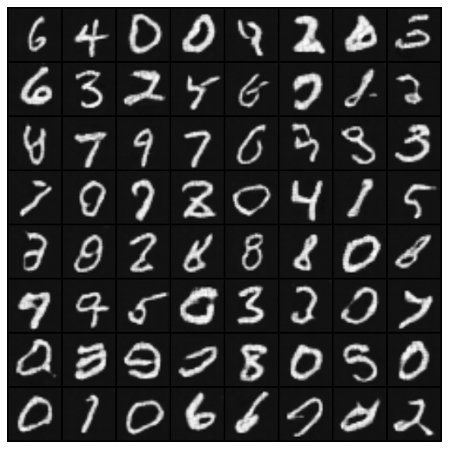

In [ ]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

- Finally, lets take a look at some real images and fake images side by side. Are fake data realistic?

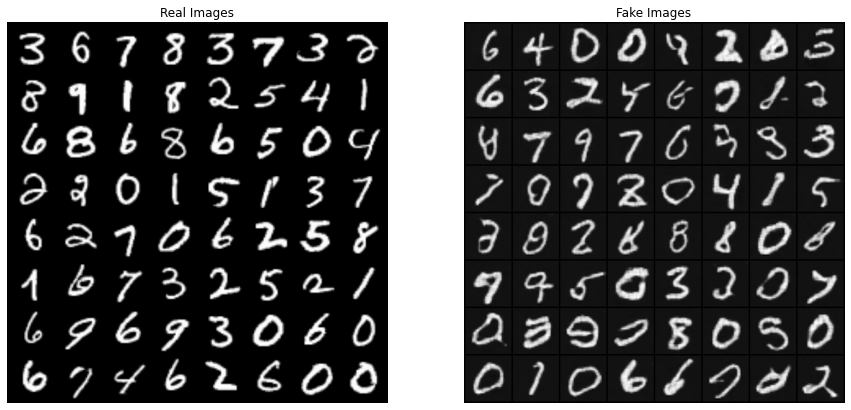

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

- We are going to generate other *batches* of fake images from random noise. Please, analyze the results. Which digits are better recognizable? Can you find particular digits that are not correctly generated?

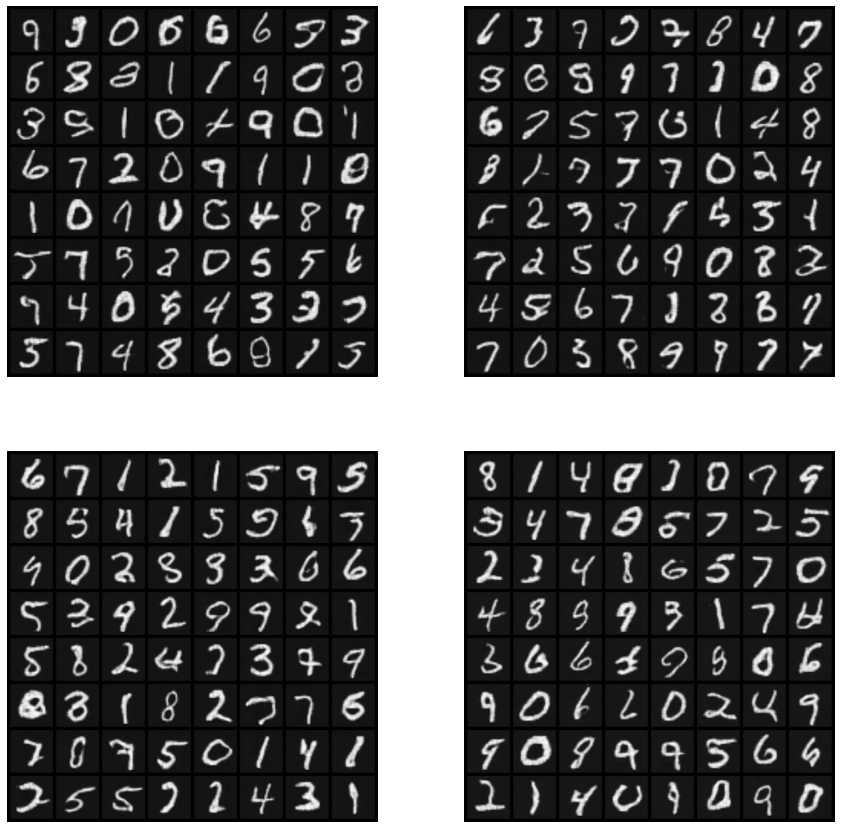

In [ ]:
plt.figure(figsize=(15,15))

for i in range(4):
    with torch.no_grad():
        random_noise = torch.randn(64, nz, 1, 1, device=device)
        netG.eval()
        fake = netG(random_noise).detach().cpu()   
    plt.subplot(2,2,i+1)
    plt.axis("off")
    plt.imshow(np.transpose(vutils.make_grid(fake[:64], padding=5, normalize=True).cpu(),(1,2,0)))
plt.show()

- What happens if we set some of the noise inputs to zero or to fixed values? For each input value, is the network providing just one or a few modes?

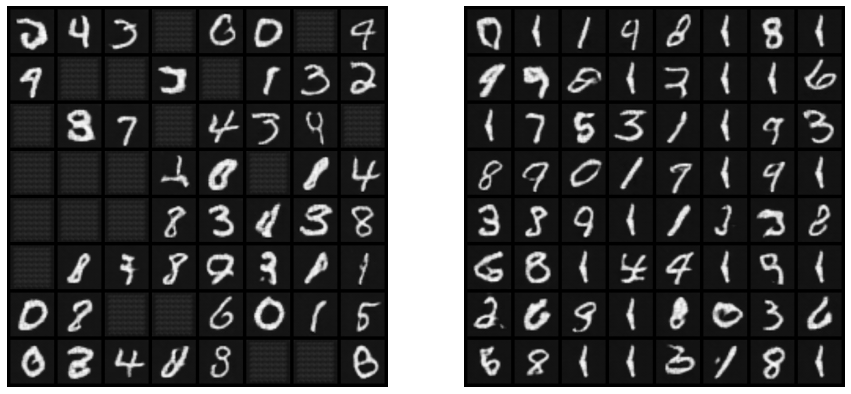

In [ ]:
# We put some dimensions to 0
random_noise = torch.randn(64, nz, 1, 1, device=device)
# We put random elements to 0
for i in range(20):
    random_noise[random.randint(0,63),:,:,:]=0
with torch.no_grad():
    netG.eval()
    fake = netG(random_noise).detach().cpu() 
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.imshow(np.transpose(vutils.make_grid(fake[:64], padding=5, normalize=True).cpu(),(1,2,0)))
# We fix a lot of elements with the same value
random_noise = torch.randn(64, nz, 1, 1, device=device)
for i in range(20):
    random_noise[random.randint(0,63),:,:,:]=-1
with torch.no_grad():
    netG.eval()
    fake = netG(random_noise).detach().cpu() 
plt.subplot(1,2,2)
plt.axis("off")
plt.imshow(np.transpose(vutils.make_grid(fake[:64], padding=5, normalize=True).cpu(),(1,2,0)))
plt.show()

- In GANS we do not explicitly compute a latent representation from the real rata. Therefore, we cannot directly mix those representations to produce an mixed output. However, if we average the noise inputs, is the resulting generated image (thrid column) a mix of the individual ones? Does it contains components of both images?

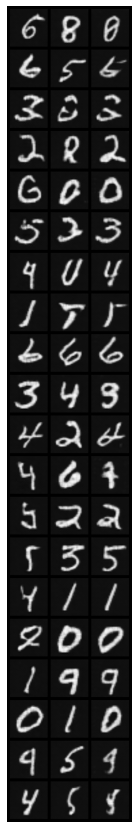

In [ ]:
random_noise = torch.randn(64, nz, 1, 1, device=device)
# We change the sample to the structure: sample1-sample2-sum2//sample1-sample2-sum//...
for i in range (2,64,3):
    random_noise[i,:,:,:]=(random_noise[i-1,:,:,:]+random_noise[i-2,:,:,:])/2

with torch.no_grad():
    fake = netG(random_noise).detach().cpu()   
plt.figure(figsize=(15,15))
plt.axis("off")
plt.imshow(np.transpose(vutils.make_grid(fake[:60], nrow=3,padding=5, normalize=True).cpu(),(1,2,0)))
plt.show()

### 2. Problems with GANs.

#### _Mode collapse_ [7]

_Mode collapse_ is one of the most difficult problems to solve with GANs. The actual data distributions are multi-modal. For example, there are 10 classes in the MNIST database (handwritten digits 0-9). The _mode collapse_ refers to a GAN training problem whereby the generative network is only capable of producing one of the distribution modes, see the following figure [7], or a mixture of the distribution modes. The figure refers to two GANs trained to generate handwritten digits from MNIST. While the former is properly trained and capable of producing synthetic images that comprise all digits, the latter is only capable of producing digit 6.

![Image of Mode Collapse](http://www.tsc.uc3m.es/~igonzalez/images/mode_collapse.png)

This training problem is quite common, as it is also usual for a * partial collapse * to occur, that is, for the network to produce synthetic images that respond in few ways. An example for generating faces can be seen in the figure below. Many of the synthetic faces generated by the network are very similar. If you continue training, these modes will dominate and the images generated by the network will respond only to those modes.

![Image of Face Collapse](http://www.tsc.uc3m.es/~igonzalez/images/caras_collapse.png)

- Observe the previous generated digits? Are all classes roughly equally likely or otherwise some digits are dominant in the outputs? 

#### _Diminished gradient_ [7]

Another major problem that occurs when training a GAN is the _diminished gradient_. This occurs when the discriminator is so good that the gradient in the generator fades away and nothing is learned, that is, the generator is not updated enough to provide good _fakes_.

- How could you simulate this problem for the scenario being modeled?

Apart from non-convergence, * mode collapse * and * diminished gradient * are the most common problems when training GANs. For a more detailed analysis of the convergence of generative networks, see [7].

### 3. Use of *batchnorm*

This section will experimentally justify the design decision of generative networks to use the * batch  normalization *. For this, the following are generated:

- A generator and a discriminator in which the * batch normalization * is eliminated.

The same experiment is repeated and the result is analyzed.

Starting Training Loop...
[0/5][0/469]	Loss_D: 1.3919	Loss_G: 0.6915	D(x): 0.4972	D(G(z)): 0.5000 / 0.5008
[0/5][50/469]	Loss_D: 0.8846	Loss_G: 0.6596	D(x): 0.8405	D(G(z)): 0.5039 / 0.5172
[0/5][100/469]	Loss_D: 0.9228	Loss_G: 0.7413	D(x): 0.9314	D(G(z)): 0.5714 / 0.4774
[0/5][150/469]	Loss_D: 0.8351	Loss_G: 0.8756	D(x): 0.9263	D(G(z)): 0.5269 / 0.4209
[0/5][200/469]	Loss_D: 0.6980	Loss_G: 0.6972	D(x): 0.9911	D(G(z)): 0.4977 / 0.4980
[0/5][250/469]	Loss_D: 0.6934	Loss_G: 0.6931	D(x): 0.9999	D(G(z)): 0.5000 / 0.5000
[0/5][300/469]	Loss_D: 0.6933	Loss_G: 0.6931	D(x): 0.9999	D(G(z)): 0.5000 / 0.5000
[0/5][350/469]	Loss_D: 0.6932	Loss_G: 0.6932	D(x): 1.0000	D(G(z)): 0.5000 / 0.5000
[0/5][400/469]	Loss_D: 0.6932	Loss_G: 0.6932	D(x): 0.9999	D(G(z)): 0.5000 / 0.5000
[0/5][450/469]	Loss_D: 0.6932	Loss_G: 0.6931	D(x): 1.0000	D(G(z)): 0.5000 / 0.5000
[1/5][0/469]	Loss_D: 0.6932	Loss_G: 0.6931	D(x): 1.0000	D(G(z)): 0.5000 / 0.5000
[1/5][50/469]	Loss_D: 0.6932	Loss_G: 0.6932	D(x): 1.0000	D(G(z)): 

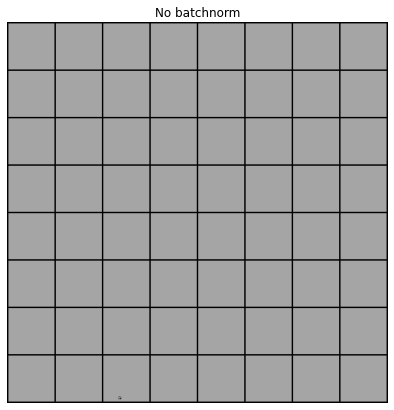

In [ ]:
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.backends.cudnn.enabled = False
# No batchnorm
batchnorm_dir=os.path.join('results','no_batchnorm')
if not os.path.exists(batchnorm_dir):
    os.makedirs(batchnorm_dir)
    
class Generator_no_batchnorm(nn.Module):
    def __init__(self, ngpu):
        super(Generator_no_batchnorm, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)
    
class Discriminator_no_batchnorm(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator_no_batchnorm, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

# Generator without batchnorm
netG_no_batchnorm = Generator_no_batchnorm(ngpu).to(device)
if (device.type == 'cuda') and (ngpu > 1):
    netG_no_batchnorm = nn.DataParallel(netG_no_batchnorm, list(range(ngpu)))
netG_no_batchnorm.apply(weights_init)
netG.apply(weights_init)
    
# Discriminator without batchnorm
netD_no_batchnorm = Discriminator_no_batchnorm(ngpu).to(device)
if (device.type == 'cuda') and (ngpu > 1):
    netD_no_batchnorm = nn.DataParallel(netD_no_batchnorm, list(range(ngpu)))
netD_no_batchnorm.apply(weights_init)

# Learning rate for optimizers
lr_D = lr
lr_G = lr

# Setup Adam optimizers for both G and D
optimizerD_no_batchnorm = optim.Adam(netD_no_batchnorm.parameters(), lr=lr_D, betas=(beta1, 0.999))
optimizerG_no_batchnorm = optim.Adam(netG_no_batchnorm.parameters(), lr=lr_G, betas=(beta1, 0.999))
[D_losses_no_batchnorm,G_losses_no_batchnorm,img_list_no_batchnorm]=train_gan(netD_no_batchnorm, netG_no_batchnorm, dataloader, optimizerD_no_batchnorm, optimizerG_no_batchnorm,num_epochs,batchnorm_dir)

# Plot the fake images from the last epoch
plt.figure(figsize=(7,7))
plt.axis("off")
plt.title("No batchnorm")
plt.imshow(np.transpose(img_list_no_batchnorm[-1],(1,2,0)))
plt.show()

### 4. Optional: If you plan to make your final project in this topic


In case you would like to make your final project in this topic, you can make additional experiments about the use of GANs for image generation, tackling issues as:

- Dig deeper into the architecture (observe the dependence of the results with its modifications).
- Analyze the results and provide improvement strategies.
- Apply the model to other tasks, analyzing the differences with the proposed task.

In the following paragraphs some of the ideas are extended:



- Train longer to see if results improve. Analyze the less realistic results and propose improvement strategies.

- Modify this model: resize images and architecture. Analyze the results.

- Modify and train the network in other databases, analyze the differences with the case of the generation of digits and between them:
  - `Celeb-A Faces`: to download the` Celeb-A Faces` database, use the link in [4] or `Google Drive` [5]. The database will be downloaded as a file called * img_align_celeba.zip *. Once downloaded, generate a directory called * celeba * and extract the .zip file into that directory. The resulting directory structure should be `/ path / to / celeba-> img_align_celeba -> 188242.jpg 173822.jpg ...` This is an important step since we will use the ImageFolder class to create the dataset in Pytorch, which requires that there are subdirectories in the root folder of the database. Analyze the image mix at the network output in this case.
  - CIFAR-10: to download the CIFAR-10 database, the Pytorch class is used.
  
  A sample code from the cell below is included for loading both databases.

- If you train the network in a database that allows classification (for example, MNIST or CIFAR-10), the characteristics extracted by the discriminator can be used to construct a simple classifier, as in [3].
 

In [ ]:
# # Code example for Celeba and CIFAR-10

# # CELEBA
# dataroot = "celeba"
# # We can use an image folder dataset the way we have it setup.
# # Create the dataset
# dataset = dset.ImageFolder(root=dataroot,
#                            transform=transforms.Compose([
#                                transforms.Resize(image_size),
#                                transforms.CenterCrop(image_size),
#                                transforms.ToTensor(),
#                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
#                            ]))
# # Create the dataloader
# dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
#                                          shuffle=True, num_workers=workers)

# # Plot some training images
# real_batch = next(iter(dataloader))
# plt.figure(figsize=(8,8))
# plt.axis("off")
# plt.title("Training Images")
# plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# # CIFAR10
# dataroot = "cifar10"
# if not os.path.exists(dataroot):
#     os.makedirs(dataroot)
    
# dataset = dset.CIFAR10(dataroot, train=True, download=True,
#                            transform=transforms.Compose([
#                                transforms.Resize(image_size),
#                                transforms.ToTensor(),
#                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
#                            ]))
# # Create the dataloader
# dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
#                                          shuffle=True, num_workers=workers)

# # Plot some training images
# real_batch = next(iter(dataloader))
# plt.figure(figsize=(8,8))
# plt.axis("off")
# plt.title("Training Images")
# plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
